In [1]:
using LinearAlgebra
using Plots

In [2]:
# Definición de las matrices de Pauli
sigmax = [0 1.0; 1 0]
sigmay = [0 -1.0im; im 0]  # im representa la unidad imaginaria √(-1)
sigmaz = [1.0 0; 0 -1]

2×2 Matrix{Float64}:
 1.0   0.0
 0.0  -1.0

In [3]:
kron([sigmaz,sigmaz,I(2)]...)

8×8 Matrix{Float64}:
 1.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0
 0.0  1.0   0.0   0.0   0.0   0.0   0.0   0.0
 0.0  0.0  -1.0   0.0   0.0   0.0  -0.0   0.0
 0.0  0.0   0.0  -1.0   0.0   0.0   0.0  -0.0
 0.0  0.0   0.0   0.0  -1.0   0.0  -0.0   0.0
 0.0  0.0   0.0   0.0   0.0  -1.0   0.0  -0.0
 0.0  0.0  -0.0   0.0  -0.0   0.0   1.0   0.0
 0.0  0.0   0.0  -0.0   0.0  -0.0   0.0   1.0

In [4]:
sigmas = Dict(1=>sigmax, 2=>sigmay, 3=>sigmaz)
function Sigma(indice, pos, totalparticulas)
    id = I(2) #[1.0 0; 0 1.0]
    mat = sigmas[indice]
    list = []
    for i in 0:totalparticulas-1
        if i == pos 
            append!(list,[mat])
        else 
            append!(list,[id])
        end
        #println("$list")
    end
    return kron(list...)
end

Sigma (generic function with 1 method)

En un campo externo el modelo de Ising es 

$ H = - J \sum_{i=1}^{3}\sigma_i \sigma_{i+1} -h \sum_{i=1}^4 S_i  $ 

In [5]:
# Para la cadena abierta con n partículas tenemos usamos cerrada = false, para la cadena cerrada usamos cerrada = true
function Ising(N; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Sigma(3, mod(i,N),totalparticulas)*Sigma(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Sigma(1,j,totalparticulas)
    end
    return H 
end

Ising (generic function with 1 method)

In [6]:
J = 1
h = 1
Ising(4,cerrada = false)

16×16 Matrix{Float64}:
 3.0  1.0   1.0  0.0   1.0   0.0   0.0  …   0.0   0.0  0.0   0.0  0.0  0.0
 1.0  1.0   0.0  1.0   0.0   1.0   0.0      0.0   0.0  0.0   0.0  0.0  0.0
 1.0  0.0  -1.0  1.0   0.0   0.0   1.0      1.0   0.0  0.0   0.0  0.0  0.0
 0.0  1.0   1.0  1.0   0.0   0.0   0.0      0.0   1.0  0.0   0.0  0.0  0.0
 1.0  0.0   0.0  0.0  -1.0   1.0   1.0      0.0   0.0  1.0   0.0  0.0  0.0
 0.0  1.0   0.0  0.0   1.0  -3.0   0.0  …   0.0   0.0  0.0   1.0  0.0  0.0
 0.0  0.0   1.0  0.0   1.0   0.0  -1.0      0.0   0.0  0.0   0.0  1.0  0.0
 0.0  0.0   0.0  1.0   0.0   1.0   1.0      0.0   0.0  0.0   0.0  0.0  1.0
 1.0  0.0   0.0  0.0   0.0   0.0   0.0      1.0   0.0  1.0   0.0  0.0  0.0
 0.0  1.0   0.0  0.0   0.0   0.0   0.0      0.0   1.0  0.0   1.0  0.0  0.0
 0.0  0.0   1.0  0.0   0.0   0.0   0.0  …  -3.0   1.0  0.0   0.0  1.0  0.0
 0.0  0.0   0.0  1.0   0.0   0.0   0.0      1.0  -1.0  0.0   0.0  0.0  1.0
 0.0  0.0   0.0  0.0   1.0   0.0   0.0      0.0   0.0  1.0   1.0  1.0  0.0
 0

In [7]:
ishermitian(Ising(4))

true

In [8]:
typeof(eigen(Ising(4)))
size(Ising(4))

(16, 16)

In [9]:
Al= eigen(Ising(4))
Al.vectors;

In [10]:
lambda, V = eigen(Ising(4,cerrada = true));

In [11]:
example = Dict(:cerrada => true)  # Se utiliza el : para definir la llave (key) del diccionario
typeof(:a)

Symbol

In [12]:
Ising(6;example...)

64×64 Matrix{Float64}:
 6.0  1.0  1.0  0.0  1.0   0.0  0.0  …  0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  2.0  0.0  1.0  0.0   1.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  2.0  1.0  0.0   0.0  1.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  1.0  2.0  0.0   0.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  2.0   1.0  1.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  1.0  -2.0  0.0  …  0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  0.0  1.0   0.0  2.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0   1.0  1.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0   0.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0   0.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 ⋮                         ⋮         ⋱                  ⋮              
 0.0  0.0  0.0  0.0  0.0   0.0  0.0  …  0.0   0.0  0.0  0.0  0.0  0.0  1.0
 0.0  0.0  0.0  0.0  0.0   0.0  0.0     1.0   1.0  0.0  1.0  0.0  0.0  0.0
 0.0 

In [13]:
# En un campo externo h 
function Ising2(N,h; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Sigma(3, mod(i,N),totalparticulas)*Sigma(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Sigma(1,j,totalparticulas)
    end
    return H 
end

Ising2 (generic function with 1 method)

In [14]:
N = 4 # Número de partículas 
list = []
for b in 0:0.001:1
     Ham = Ising2(N,b,cerrada = false)
     Vals = eigen(Ham).values
     append!(list,map(x->[b,x],Vals))
end

In [15]:
list
x_list = [l[1] for l in list]
y_list = [l[2] for l in list]

16016-element Vector{Float64}:
 -3.0
 -3.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
  1.0
  1.0
  ⋮
 -0.30540728933227523
  0.30540728933228145
  1.0000000000000004
  1.0000000000000049
  1.6945927106677239
  2.0641777724759147
  2.758770483143631
  4.064177772475913
  4.758770483143634

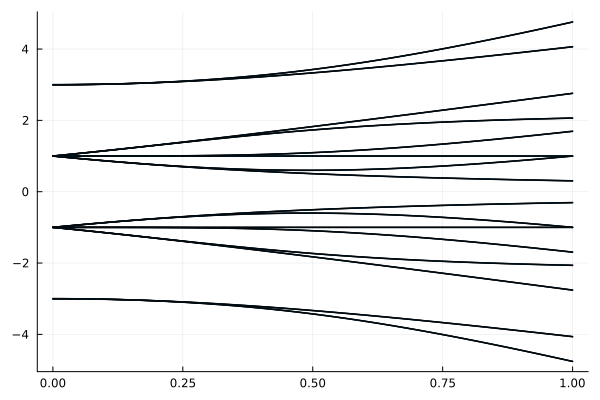

In [16]:
scatter(x_list,y_list, label = false, markersize = 0.5)
# Con el campo se rompe la simetría esférica (se rompe la degeneración)

In [17]:
function IsingRand(N,b,Aleat; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N

    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ Aleat[i+1]*(Sigma(3, mod(i,N),totalparticulas)*Sigma(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ b*Sigma(1,j,totalparticulas)
    end
    return H 
end

IsingRand (generic function with 1 method)

In [18]:
epsilon = 0.5
a1 = 1-epsilon
b1 = 1+epsilon
Nrand = 4 # Número de partículas 
Aleat = rand(Nrand).*(b1-a1).+a1

4-element Vector{Float64}:
 0.5341187650912651
 1.4913228026199503
 0.5204460104477971
 0.6560564872289797

In [19]:
listrand = []

for b in 0:0.001:1
     Ham = IsingRand(Nrand,b,Aleat,cerrada = false)
     Vals = eigen(Ham).values
     append!(listrand,map(x->[b,x],Vals))
end
Aleat

4-element Vector{Float64}:
 0.5341187650912651
 1.4913228026199503
 0.5204460104477971
 0.6560564872289797

In [20]:
x_listrand = [l[1] for l in listrand]
y_listrand = [l[2] for l in listrand];

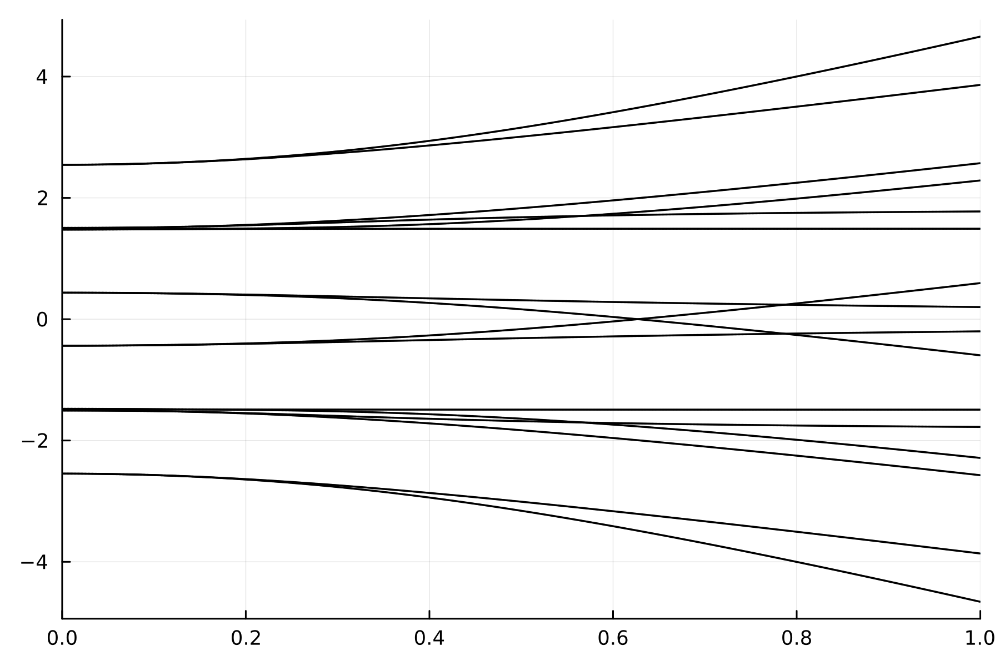

In [21]:
scatter(x_listrand,y_listrand, label = false, markersize = 0.25, dpi = 300,xlims= (0,1))#,  ylims=(-0.5,0.75) )#, xlims=(0.,1.25), ylims=(-2,2.25))

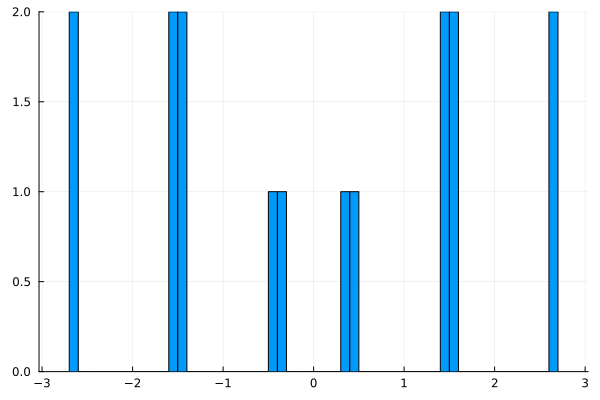

In [22]:
# Calcularemos Valores Propios para b fijo
ValoresPropios = eigen(IsingRand(Nrand,0.2,Aleat; cerrada = false)).values
histogram(ValoresPropios, bins = 50, label = false)

In [23]:
AHist = [-ValoresPropios[i]+ ValoresPropios[i+1] for i in 1:length(ValoresPropios)-1]

15-element Vector{Float64}:
 0.006730940375132555
 1.0822831765137622
 0.00673094037514943
 0.05212224774796681
 0.006730940375148542
 1.0822831765137604
 0.006730940375148542
 0.7989467619241815
 0.006730940375149874
 1.0822831765137584
 0.006730940375149208
 0.052122247747965256
 0.006730940375149208
 1.0822831765137568
 0.00673094037514943

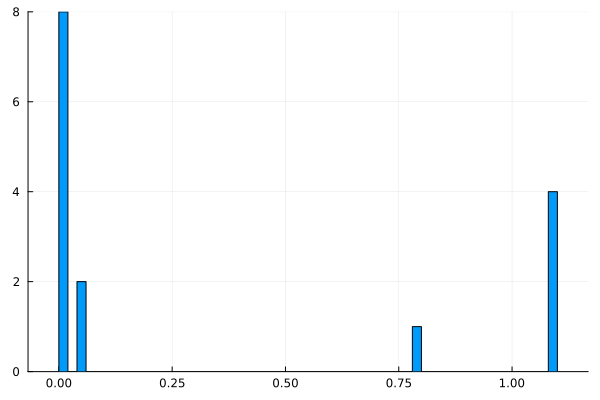

In [24]:
histogram(AHist, bins = 50, label = false)

In [25]:
ValoresPropios = eigen(IsingRand(2,0.2,Aleat; cerrada = false)).values

4-element Vector{Float64}:
 -0.6672951784799716
 -0.5341187650912651
  0.5341187650912652
  0.6672951784799723

In [26]:
IsingRand(2,0.2,Aleat; cerrada = false)

4×4 Matrix{Float64}:
 0.534119   0.2        0.2       0.0
 0.2       -0.534119   0.0       0.2
 0.2        0.0       -0.534119  0.2
 0.0        0.2        0.2       0.534119

$ \hat P = \prod_{i=1}^N \sigma_i^x$

Actividad/Tarea 

Encontrar eigenvectores 

Encontrar proyector correspondiente al eigenvalor 1 (a todos los elementos con eigenvalor 1)
y al eigenvalor -1 

los proyectores son $\ket{v_1}\bra{v_1} + ...$

$\tilde H_{ij} = \bra{v_i}H\ket{v_j}$



In [27]:
function parity(particles)
    list = [sigmas[1] for _ in 1:particles]
    return kron(list...)
end

parity (generic function with 1 method)

In [29]:
# N es Número de partículas 
# b es el campo externo
Ham = IsingRand(4,0.01,Aleat; cerrada = false)

16×16 Matrix{Float64}:
 2.54589  0.01    0.01      0.0       …   0.0        0.0      0.0    0.0
 0.01     1.505   0.0       0.01          0.0        0.0      0.0    0.0
 0.01     0.0    -1.47765   0.01          0.0        0.0      0.0    0.0
 0.0      0.01    0.01     -0.436758      0.0        0.0      0.0    0.0
 0.01     0.0     0.0       0.0           0.01       0.0      0.0    0.0
 0.0      0.01    0.0       0.0       …   0.0        0.01     0.0    0.0
 0.0      0.0     0.01      0.0           0.0        0.0      0.01   0.0
 0.0      0.0     0.0       0.01          0.0        0.0      0.0    0.01
 0.01     0.0     0.0       0.0           0.01       0.0      0.0    0.0
 0.0      0.01    0.0       0.0           0.0        0.01     0.0    0.0
 0.0      0.0     0.01      0.0       …   0.0        0.0      0.01   0.0
 0.0      0.0     0.0       0.01          0.0        0.0      0.0    0.01
 0.0      0.0     0.0       0.0          -0.436758   0.01     0.01   0.0
 0.0      0.0     0.0     

In [61]:
AP[1,:]'*Ham*AP[1,:]

2.0017688130677476

In [176]:
function ProjectionParity(N,b, Aleat; cerrada = false)
    H = IsingRand(N,b,Aleat, cerrada = false)
    P = parity(N)

    #A = eigen(P).vectors

    #Avals = eigen(P).values    

    HPos = zeros(2^(N-1),2^(N-1))
    HNeg = zeros(2^(N-1),2^(N-1))

    for i in 1:2^(N-1)
        if Avals[i] > 0
            A = eigen(parity(4)).vectors[:,i]
        else
            A = zeros(length(2^(N-1),1))
        end
        for j in 1:2^(N-1)
            if Avals[j] > 0
                A = eigen(parity(4)).vectors[:,j]
            else
                A = zeros(length(2^(N-1),1))
            end
            HPos[i,j] = A[:,i]'*H*A[:,j]
        end
        if Avals[i] < 0
            B = eigen(parity(4)).vectors[:,i]
        else
            B = zeros(length(2^(N-1),1))
        end
        for k in 1:2^(N-1)
            HNeg[i,k] = B[:,i]'*H*B[:,k]
        end
    end
    return HPos, HNeg
end

ProjectionParity (generic function with 1 method)

In [177]:
ProjectionParity(4, 0.5, Aleat, cerrada = false)[1]

BoundsError: BoundsError: attempt to access 16-element Vector{Float64} at index [1:16, 2]

In [181]:
A = eigen(parity(4)).vectors
A[:,1]

16-element Vector{Float64}:
  0.0
  0.7071067811865475
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
 -0.7071067811865477
  0.0

In [126]:
A[1,:] # es el vector transpuesto, como los valores propios son reales, no hace falta conjugar y con esto tenemos ya lo que buscamos
# el problema está en que es un vector columna entonces
A[1,:]' # así solucionamos el problema y lo convertimos en vector fila
# Por último los vectores normales (columna) de la matriz son 
A[:,1] #entonces el producto debe verse como, pero si son vectores propios, esto deberia de ser 1, no?

A[1,:]'*A[:,1]
A[:,1]'*A[:,1]

0.9999999999999993

In [120]:
B = A'

16×16 adjoint(::Matrix{Float64}) with eltype Float64:
  3.32184e-5  -0.00174571  -0.00661885  …  -0.00174571   3.32184e-5
 -3.18088e-7   0.00174517  -0.00661769     -0.00174517   3.18089e-7
  0.00175033   5.07427e-5  -0.00203306     -5.07427e-5  -0.00175033
  0.00175013  -1.73613e-5  -0.0019059      -1.73613e-5   0.00175013
  0.00175237  -3.86127e-5  -0.707028        3.86126e-5  -0.00175237
  0.00175218  -1.87984e-5  -0.707029    …  -1.87984e-5   0.00175218
  2.03678e-5   0.00364101  -0.00679134      0.00364101   2.03678e-5
 -7.57186e-7  -0.00364082   0.00679285      0.00364082   7.57186e-7
 -9.83565e-5   0.00661901   0.00369282     -0.00661901   9.83565e-5
  2.88013e-5  -0.0066175    0.00369302     -0.0066175    2.88013e-5
 -0.00660024  -0.00205641   1.89724e-5  …  -0.00205641  -0.00660024
 -0.00663635   0.00192926  -5.20354e-5     -0.00192926   0.00663635
 -0.00681166   0.707029     1.75205e-5      0.707029    -0.00681166
 -0.00677262   0.707029    -3.84594e-5     -0.707029     0.006

In [124]:
B[:,5]'

1×16 adjoint(::Vector{Float64}) with eltype Float64:
 -0.0067927  0.00679152  -0.707029  -0.707029  …  -0.00174517  0.00174571

In [105]:
v = eigen(parity(4)).values
positivos = filter(x -> x > 0, v)
# vec = vecs[:, findall(vals .== 1)]

8-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0

In [161]:
k = 7
if Avals[k] > 0
    A = eigen(parity(4)).vectors[:,k]
elseif Avals[k] < 0
    B = eigen(parity(4)).vectors[:,k]
end

16-element Vector{Float64}:
  0.0
  0.0
 -0.7071067811865477
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.7071067811865475
  0.0
  0.0